In [1]:
import matplotlib.pyplot as plt
import numpy as np
#import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.layers import Input, Dense, Flatten, Reshape, Dropout, LeakyReLU, ReLU, LayerNormalization, GaussianNoise
#from tensorflow.keras.layers import BatchNormalization
from tensorflow.compat.v1.keras.layers import BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from keras.layers.core import Activation, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose, MaxPooling2D
from keras import initializers
from math import ceil
import time
from tensorflow_addons.layers import SpectralNormalization

In [2]:
#Updated Versions
#Spectral Normalization Model
def build_cifar10_discriminator(image_shape=(32, 32, 3)):
    
    model = Sequential()
    
    #16 output filters, so number of channels jumps from 1 to 16
    #kernel_size = 5 means we use a 5x5 convolution window
    #strides defaults to (1,1) when unspecified, "same" padding means we'll preserve the image size
    model.add(Conv2D(16, kernel_size=5, strides=2, padding="same", input_shape=(32, 32, 3), 
                     activation = 'relu', use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))) #40
    model.add(LeakyReLU(0.2))
    model.add(SpectralNormalization(Conv2D(32, kernel_size=5, strides=2, padding="same", 
                     activation = 'relu', use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(0.2))
    
    #Second layer
    model.add(SpectralNormalization(Conv2D(64, kernel_size=5, strides=2, padding="same", 
                     activation = 'relu', use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(0.2))
    model.add(SpectralNormalization(Conv2D(128, kernel_size=5, strides=2, padding="same", 
                     activation = 'relu', use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(0.2))

    #Flatten for Final Output Layer
    model.add(Flatten())

    #Output layer
    model.add(Dense(1, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(Activation("sigmoid"))
    
    #Final Output
    print("\nDiscriminator")
    model.summary()
    return model




#Spectral Normalization Model
def build_cifar10_generator(z_dim=100):
    
    model = Sequential()
    
    #First Layer (4x4)
    model.add(Dense(4*4*128, input_dim=z_dim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(Reshape((4,4,128)))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2))
    
    # upsample to 8x8
    model.add(SpectralNormalization(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', 
                              use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(alpha=0.2))
    
    # upsample to 16x16
    model.add(SpectralNormalization(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', 
                              use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02))))
    model.add(LeakyReLU(alpha=0.2))
    
    # upsample to 32x32
    model.add(Conv2DTranspose(3, kernel_size=5, strides=2, padding='same',
          use_bias=True, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    
    # output layer
    model.add(Activation('tanh'))

    print("\nGenerator")
    model.summary()
    return model




#Build and Compile Networks
#Variables
#Loss Functions:  Don't seem to matter for performance, any choice will work
#Learning rates:  Trying higher learning rate for Discriminator;  
#Discriminator is easier to succeed, gives generator a better chance at competition, prevents mode collapse
lr_d=2e-4
lr_g=1e-4
z_dim=100
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
image_shape = X_train[0].shape

D = build_cifar10_discriminator(image_shape)
G = build_cifar10_generator(z_dim)

D.compile(Adam(learning_rate=lr_d, beta_1=0.5), loss='binary_crossentropy', metrics=['accuracy'])
D.trainable = False

z = Input(shape=(z_dim, ))
D_of_G = Model(inputs=z, outputs=D(G(z)))
D_of_G.compile(Adam(learning_rate=lr_g, beta_1=0.5), loss='binary_crossentropy', metrics=['binary_accuracy'])


Discriminator
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 16)        1216      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16, 16, 16)        0         
                                                                 
 spectral_normalization (Spe  (None, 8, 8, 32)         12864     
 ctralNormalization)                                             
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 8, 8, 32)          0         
                                                                 
 spectral_normalization_1 (S  (None, 4, 4, 64)         51328     
 pectralNormalization)                                           
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 4, 4,

In [3]:
#Function for plotting images
def plot_images(images, filename):
    h, w, c = images.shape[1:]
    #images = (1/(2*2.25)) * images + 0.5
    images = 0.5 * images + 0.5
    grid_size = ceil(np.sqrt(images.shape[0]))
    images = (images.reshape(grid_size, grid_size, h, w, c)
              .transpose(0, 2, 1, 3, 4)
              .reshape(grid_size*h, grid_size*w, c))
    plt.figure(figsize=(16, 16))
    plt.imsave(filename, images)
    
#Function for Plotting Losses During Training
def plot_losses(losses_d, losses_g, filename):
    fig, axes = plt.subplots(1, 2, figsize=(8, 2))
    axes[0].plot(losses_d)
    axes[1].plot(losses_g)
    axes[0].set_title("losses_d")
    axes[1].set_title("losses_g")
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    #plt.close()
    
#Functions for smoothing labels of 1 and 0
# Smoothing class=1 to [0.8, 1.0]
def smooth_positive_labels(y):
    return y - 0.2 + (np.random.random(y.shape) * 0.2)

# Smoothing class=0 to [0.0, 0.1]
def smooth_negative_labels(y):
    return y + (np.random.random(y.shape) * 0.1)

#Function for generating latent points to feed into generator
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
     x_input = np.random.randn(latent_dim * n_samples)
     # reshape into a batch of inputs for the network
     x_input = x_input.reshape((n_samples, latent_dim))
     return x_input
    

#Function for adding noise to images
#  Adding noise to images prevents discriminator overfitting, inhibits performance to allow
#   for better rivalry with the generator (which is generally slower to train)
#This function adds 'salt and pepper noise' (randomly set pixels to either -1 or 1) 
# def noisy(image):
#     row,col,ch = image.shape
#     s_vs_p = 0.5
#     amount = 0.004
#     out = np.copy(image)
#     # Salt mode
#     num_salt = np.ceil(amount * image.size * s_vs_p)
#     coords = tuple([np.random.randint(0, i - 1, int(num_salt))
#             for i in image.shape])
#     out[coords] = 1

#     # Pepper mode
#     num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
#     coords = tuple([np.random.randint(0, i - 1, int(num_pepper))
#             for i in image.shape])
#     out[coords] = -1
#     return out

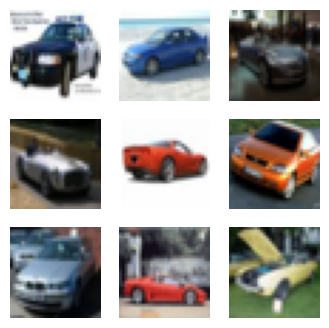

In [4]:
# #Test only grabbing images of one type

#Load the CIFAR10 data
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
#Concatenate X_train and X_test for more data
X_train = np.concatenate((X_train,X_test))
y_train = np.concatenate((y_train,y_test))
#Only use index 1, AKA cars
index = np.where(y_train.reshape(-1) == 1)
X_train = X_train[index]
y_train = y_train[index]

#Testing to make sure it's just airplanes
fig,axs = plt.subplots(3,3,figsize=(4,4),sharey=True,sharex=True)
cnt=0
for i in range(3):
    for j in range(3):
        axs[i, j].imshow(X_train[-9:][cnt,:,:])
        axs[i, j].axis('off')
        cnt+=1

image shape (32, 32, 3), min val -1.0, max val 0.9921568632125854
Epoch 0
Time for epoch:  27.45500349998474
loss_d=0.33980, loss_g=1.41647
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


<Figure size 1600x1600 with 0 Axes>

<Figure size 1600x1600 with 0 Axes>

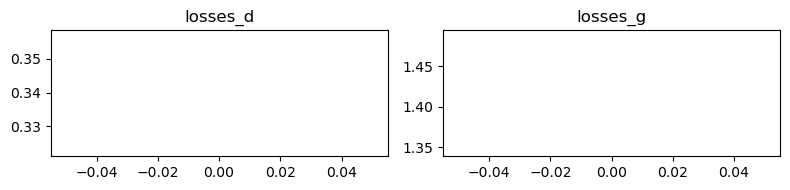

Epoch 1
Time for epoch:  26.76230812072754
Epoch 2
Time for epoch:  26.928913354873657
loss_d=0.42234, loss_g=1.78778
2/2 [==============================] - 0s 7ms/step
	Plotting images and losses


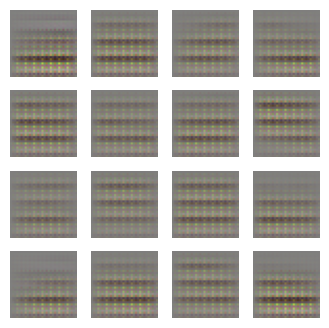

<Figure size 1600x1600 with 0 Axes>

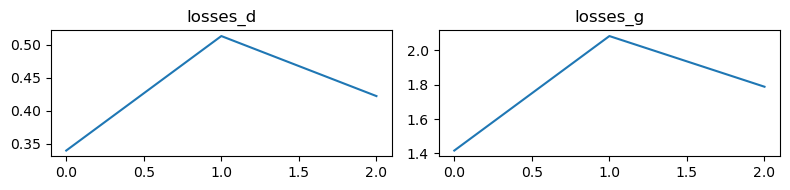

Epoch 3
Time for epoch:  25.51502275466919
Epoch 4
Time for epoch:  26.420329093933105
loss_d=0.48579, loss_g=1.21216
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


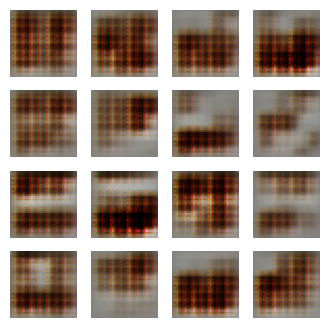

<Figure size 1600x1600 with 0 Axes>

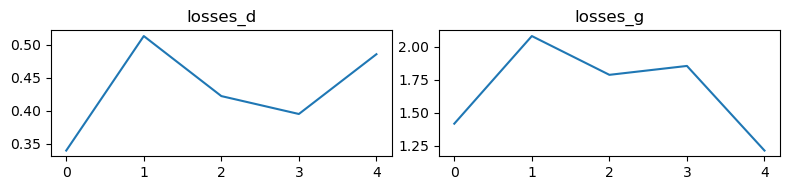

Epoch 5
Time for epoch:  23.97460651397705
Epoch 6
Time for epoch:  23.836772441864014
loss_d=0.66672, loss_g=1.14130
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


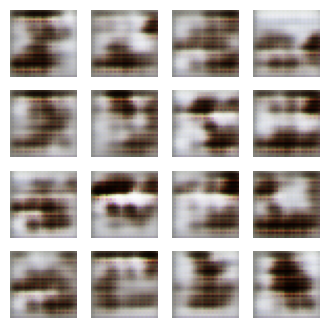

<Figure size 1600x1600 with 0 Axes>

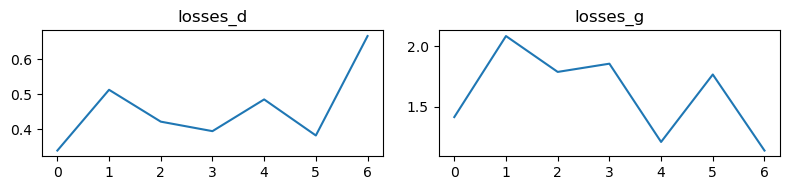

Epoch 7
Time for epoch:  23.6870539188385
Epoch 8
Time for epoch:  24.344668865203857
loss_d=0.53273, loss_g=1.61540
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


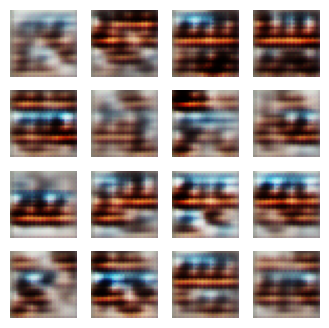

<Figure size 1600x1600 with 0 Axes>

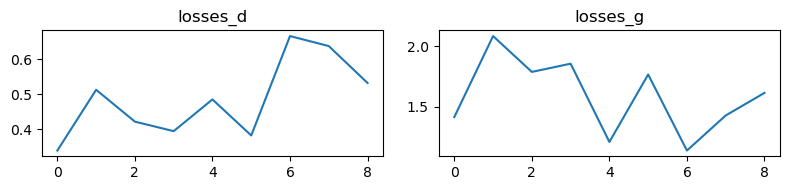

Epoch 9
Time for epoch:  24.661468029022217
Epoch 10
Time for epoch:  23.86170768737793
loss_d=0.60660, loss_g=1.30197
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


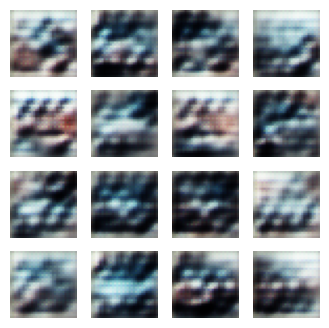

<Figure size 1600x1600 with 0 Axes>

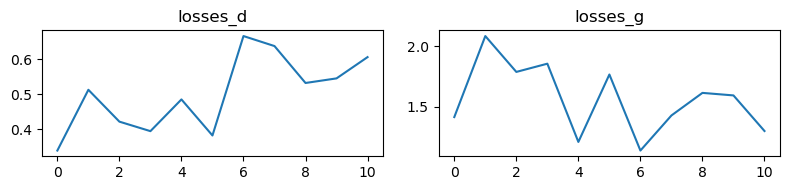

Epoch 11
Time for epoch:  23.427867889404297
Epoch 12
Time for epoch:  23.1501624584198
loss_d=0.64610, loss_g=1.20431
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


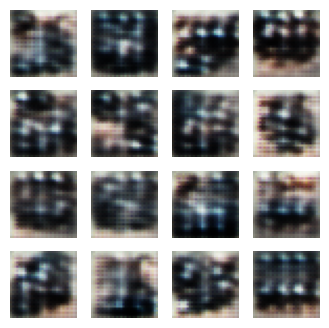

<Figure size 1600x1600 with 0 Axes>

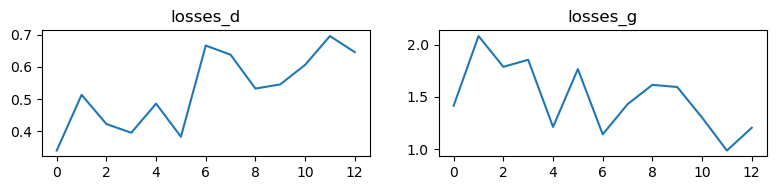

Epoch 13
Time for epoch:  23.20423173904419
Epoch 14
Time for epoch:  23.462372303009033
loss_d=0.63127, loss_g=1.28745
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


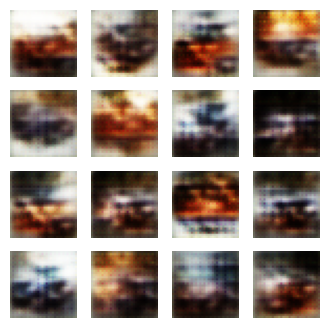

<Figure size 1600x1600 with 0 Axes>

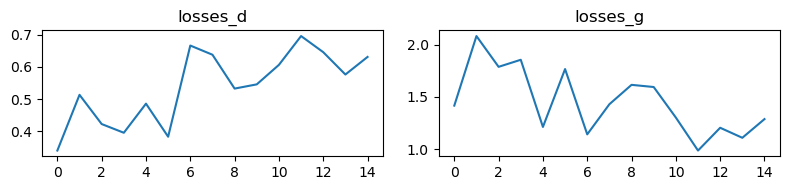

Epoch 15
Time for epoch:  24.70818018913269
Epoch 16
Time for epoch:  24.95286726951599
loss_d=0.56001, loss_g=1.43038
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


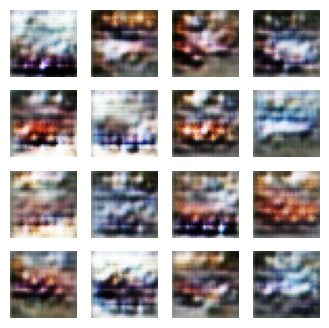

<Figure size 1600x1600 with 0 Axes>

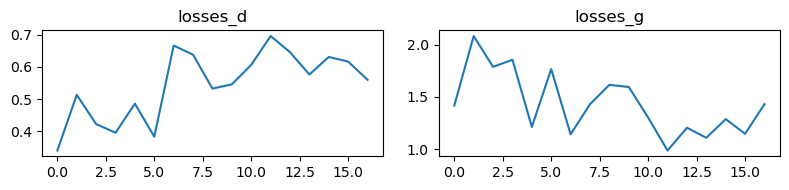

Epoch 17
Time for epoch:  24.960529088974
Epoch 18
Time for epoch:  24.677226305007935
loss_d=0.61123, loss_g=1.13057
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


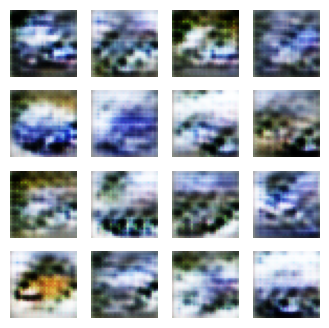

<Figure size 1600x1600 with 0 Axes>

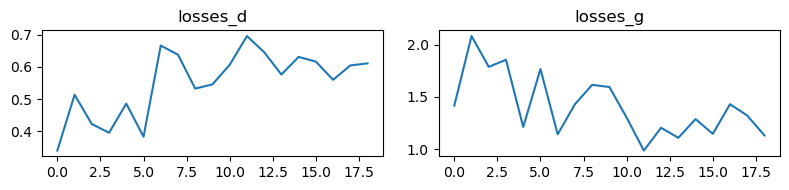

Epoch 19
Time for epoch:  23.815648317337036
Epoch 20
Time for epoch:  23.11931276321411
loss_d=0.62069, loss_g=1.11068
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


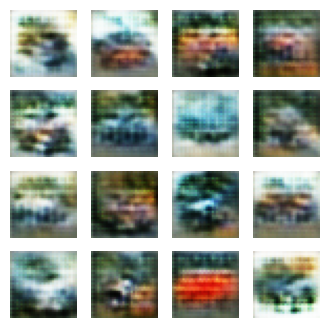

<Figure size 1600x1600 with 0 Axes>

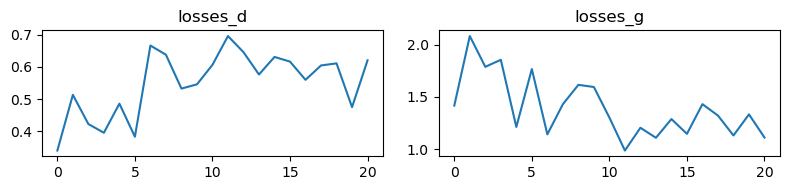

Epoch 21
Time for epoch:  23.26479148864746
Epoch 22
Time for epoch:  23.1460280418396
loss_d=0.44354, loss_g=1.52780
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


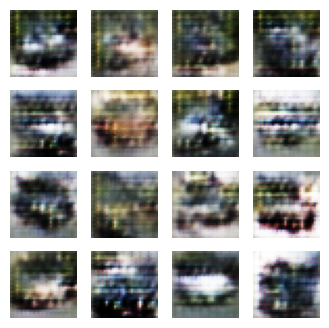

<Figure size 1600x1600 with 0 Axes>

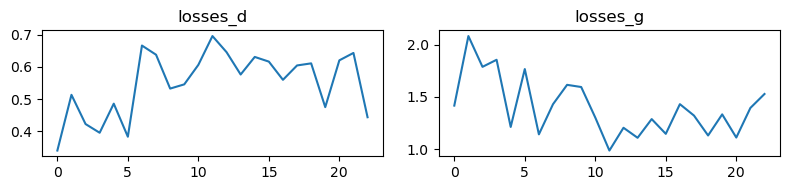

Epoch 23
Time for epoch:  23.11177158355713
Epoch 24
Time for epoch:  23.04720640182495
loss_d=0.51592, loss_g=1.24978
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


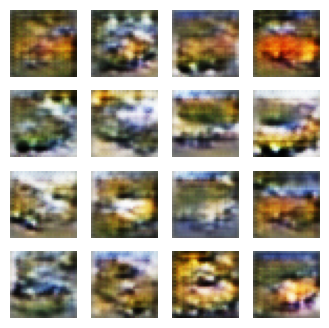

<Figure size 1600x1600 with 0 Axes>

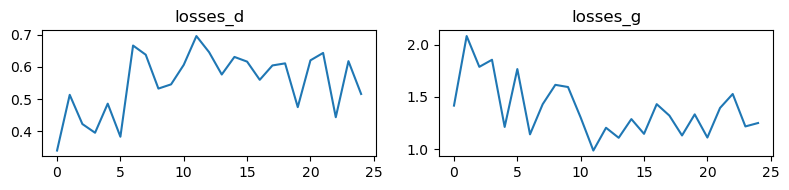

Epoch 25
Time for epoch:  23.291037559509277
Epoch 26
Time for epoch:  23.126806259155273
loss_d=0.50506, loss_g=1.33147
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


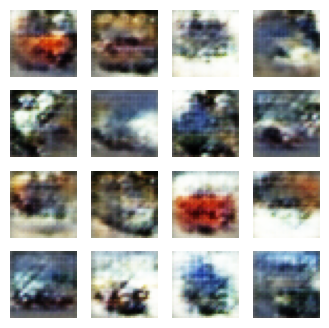

<Figure size 1600x1600 with 0 Axes>

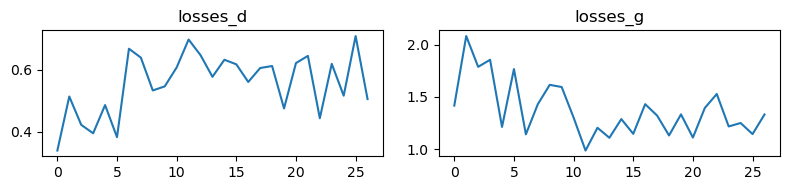

Epoch 27
Time for epoch:  23.110119581222534
Epoch 28
Time for epoch:  23.095935106277466
loss_d=0.56953, loss_g=1.34765
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


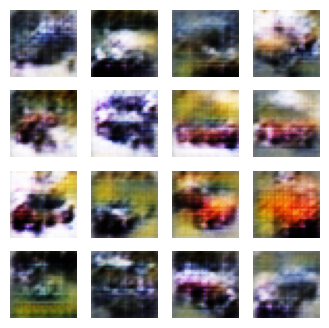

<Figure size 1600x1600 with 0 Axes>

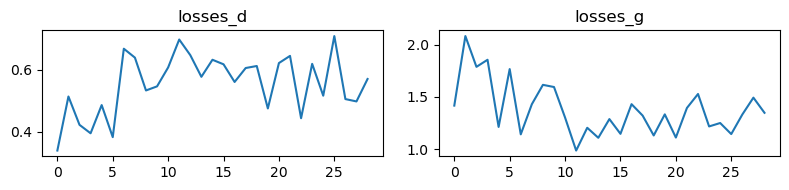

Epoch 29
Time for epoch:  25.578254222869873
Epoch 30
Time for epoch:  26.625374794006348
loss_d=0.54006, loss_g=1.44454
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


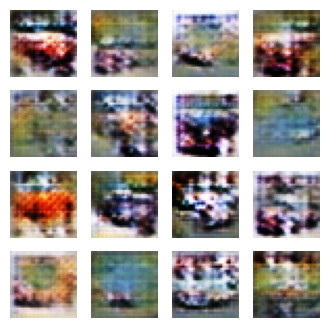

<Figure size 1600x1600 with 0 Axes>

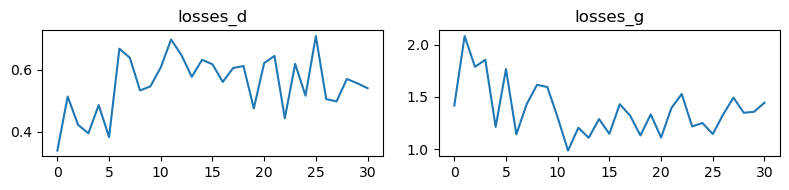

Epoch 31
Time for epoch:  25.505301237106323
Epoch 32
Time for epoch:  25.253678560256958
loss_d=0.50380, loss_g=1.45567
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


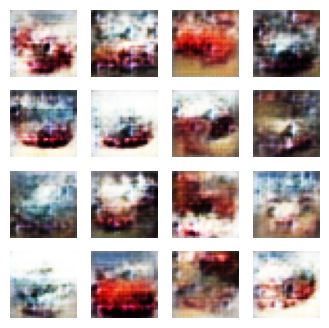

<Figure size 1600x1600 with 0 Axes>

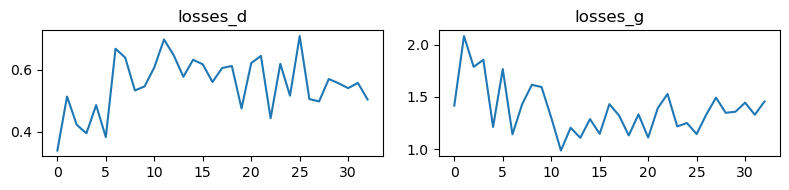

Epoch 33
Time for epoch:  25.99577236175537
Epoch 34
Time for epoch:  25.00164246559143
loss_d=0.54699, loss_g=1.33890
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


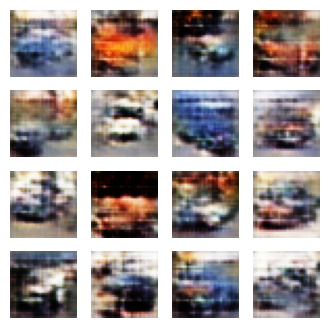

<Figure size 1600x1600 with 0 Axes>

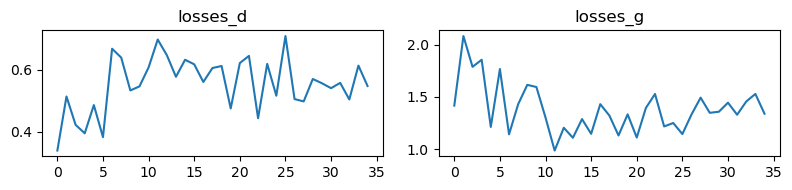

Epoch 35
Time for epoch:  25.08830976486206
Epoch 36
Time for epoch:  25.24784755706787
loss_d=0.53575, loss_g=1.15949
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


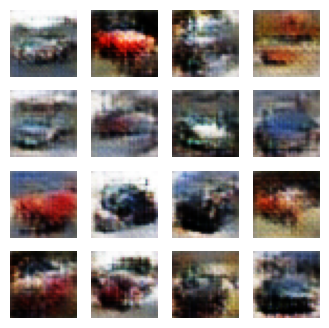

<Figure size 1600x1600 with 0 Axes>

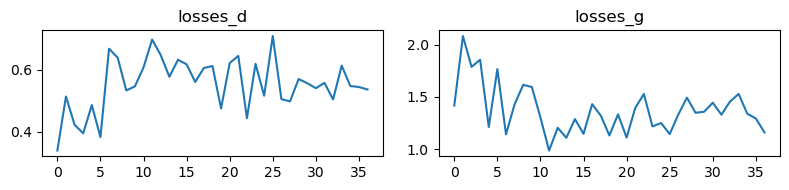

Epoch 37
Time for epoch:  24.84241557121277
Epoch 38
Time for epoch:  25.62780237197876
loss_d=0.56761, loss_g=1.23873
2/2 [==============================] - 0s 7ms/step
	Plotting images and losses


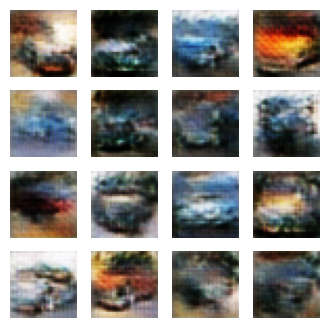

<Figure size 1600x1600 with 0 Axes>

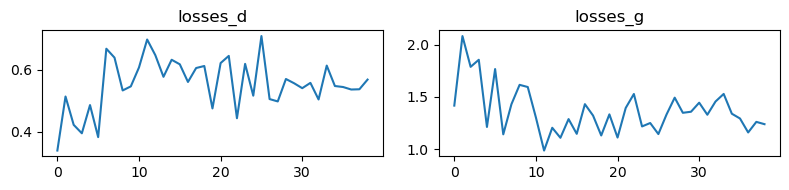

Epoch 39
Time for epoch:  25.707638263702393
Epoch 40
Time for epoch:  25.631145238876343
loss_d=0.52855, loss_g=1.36464
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


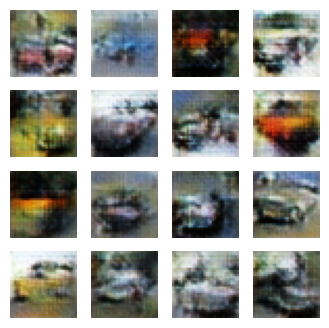

<Figure size 1600x1600 with 0 Axes>

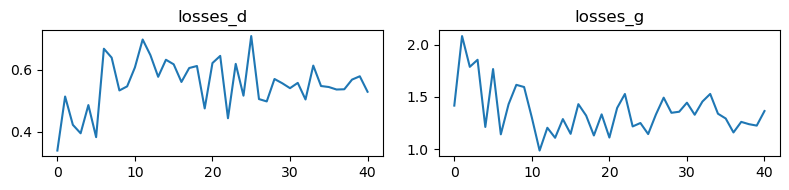

Epoch 41
Time for epoch:  25.6029531955719
Epoch 42
Time for epoch:  26.11491870880127
loss_d=0.55965, loss_g=1.28326
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


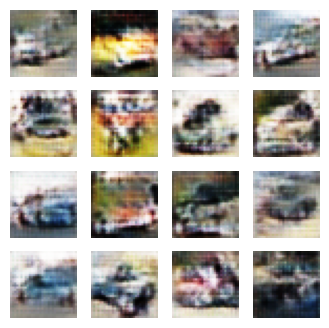

<Figure size 1600x1600 with 0 Axes>

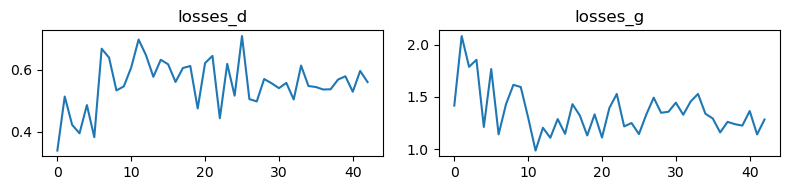

Epoch 43
Time for epoch:  28.289535760879517
Epoch 44
Time for epoch:  27.373074054718018
loss_d=0.66207, loss_g=1.14759
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


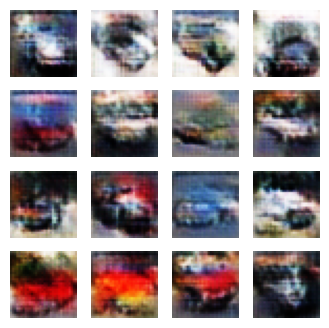

<Figure size 1600x1600 with 0 Axes>

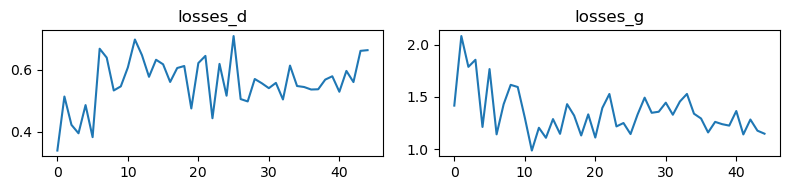

Epoch 45
Time for epoch:  26.80535364151001
Epoch 46
Time for epoch:  27.090563535690308
loss_d=0.60041, loss_g=1.16870
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


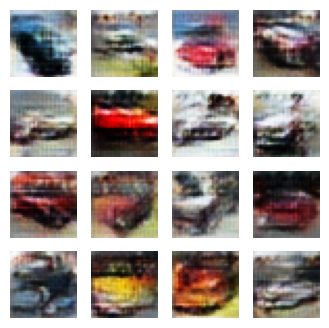

<Figure size 1600x1600 with 0 Axes>

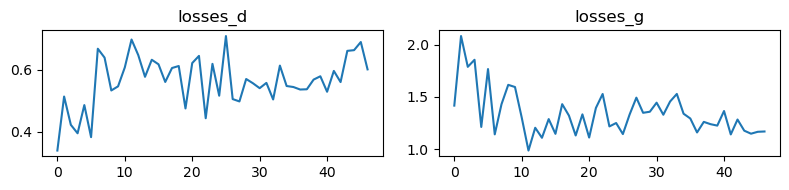

Epoch 47
Time for epoch:  26.418070793151855
Epoch 48
Time for epoch:  26.87457585334778
loss_d=0.66976, loss_g=1.18708
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


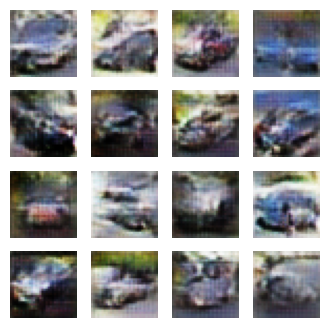

<Figure size 1600x1600 with 0 Axes>

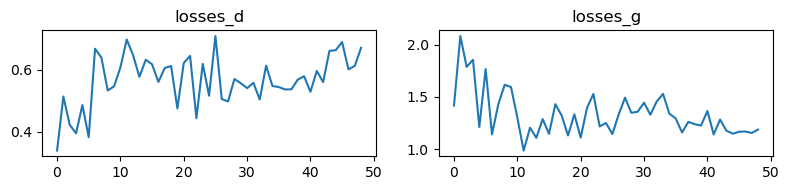

Epoch 49
Time for epoch:  27.20666766166687
Epoch 50
Time for epoch:  24.7337007522583
loss_d=0.59100, loss_g=1.18394
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


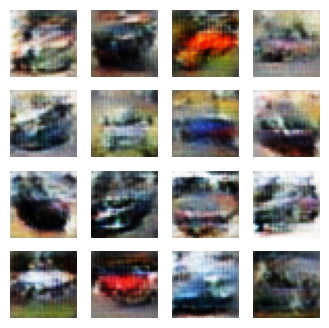

<Figure size 1600x1600 with 0 Axes>

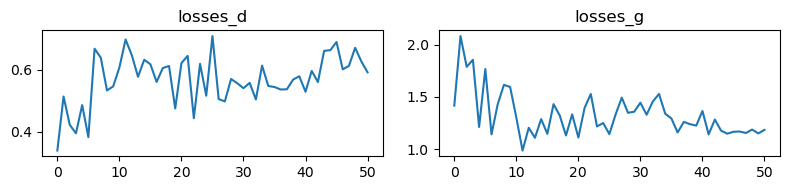

Epoch 51
Time for epoch:  24.50861954689026
Epoch 52
Time for epoch:  23.743010759353638
loss_d=0.62244, loss_g=1.07009
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


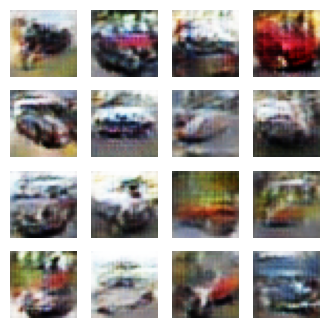

<Figure size 1600x1600 with 0 Axes>

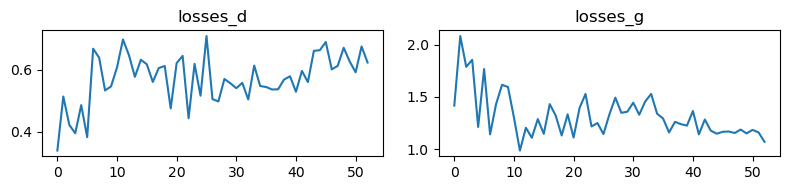

Epoch 53
Time for epoch:  23.64737558364868
Epoch 54
Time for epoch:  23.634711265563965
loss_d=0.59514, loss_g=1.16689
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


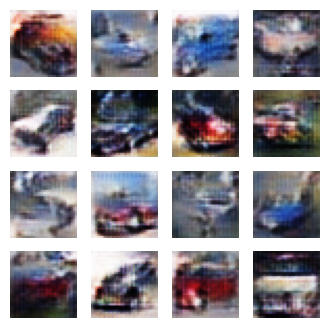

<Figure size 1600x1600 with 0 Axes>

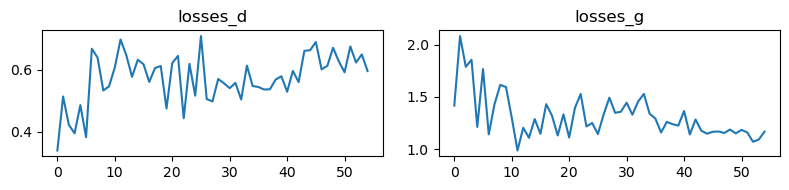

Epoch 55
Time for epoch:  26.281453132629395
Epoch 56
Time for epoch:  24.958645582199097
loss_d=0.60007, loss_g=1.17519
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


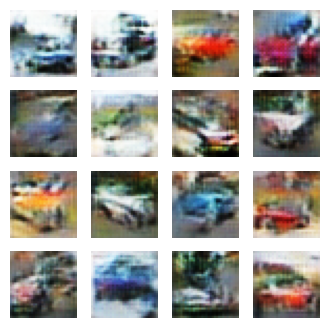

<Figure size 1600x1600 with 0 Axes>

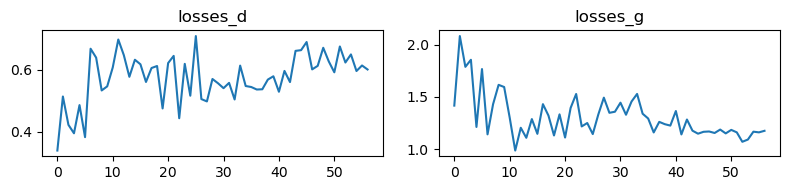

Epoch 57
Time for epoch:  25.537272930145264
Epoch 58
Time for epoch:  25.05109143257141
loss_d=0.58613, loss_g=1.14763
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


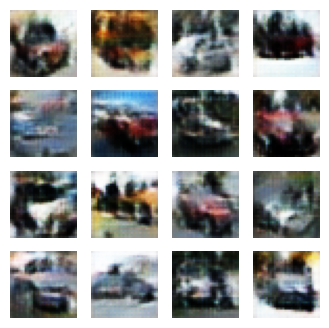

<Figure size 1600x1600 with 0 Axes>

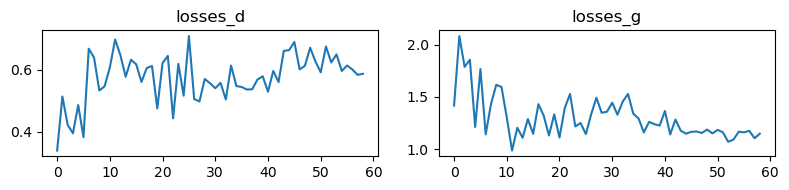

Epoch 59
Time for epoch:  26.743300676345825
Epoch 60
Time for epoch:  25.708526849746704
loss_d=0.56641, loss_g=1.09364
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


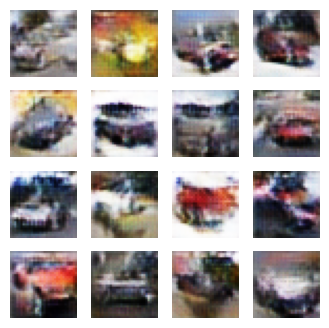

<Figure size 1600x1600 with 0 Axes>

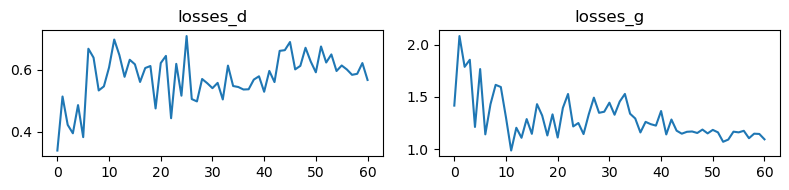

Epoch 61
Time for epoch:  23.78121042251587
Epoch 62
Time for epoch:  26.77660822868347
loss_d=0.67302, loss_g=1.20758
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


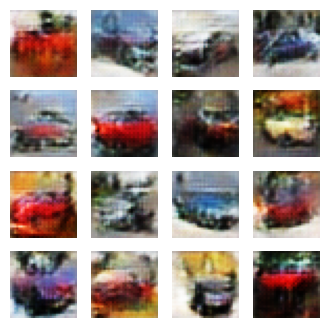

<Figure size 1600x1600 with 0 Axes>

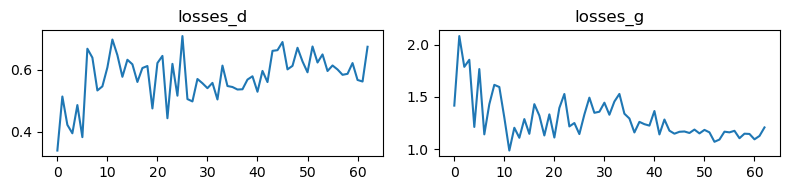

Epoch 63
Time for epoch:  25.371862173080444
Epoch 64
Time for epoch:  25.159884214401245
loss_d=0.66533, loss_g=1.11637
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


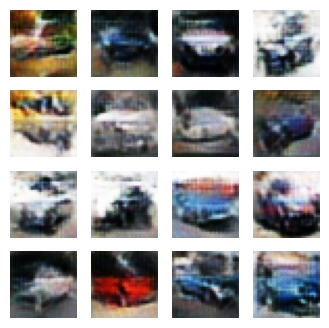

<Figure size 1600x1600 with 0 Axes>

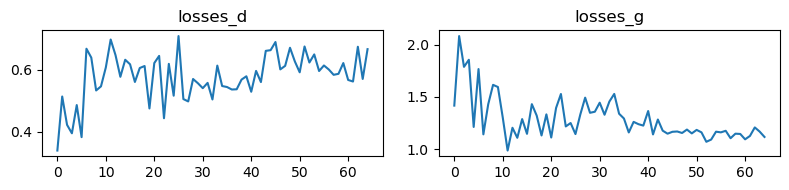

Epoch 65
Time for epoch:  25.37196373939514
Epoch 66
Time for epoch:  24.984077215194702
loss_d=0.57104, loss_g=1.15518
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


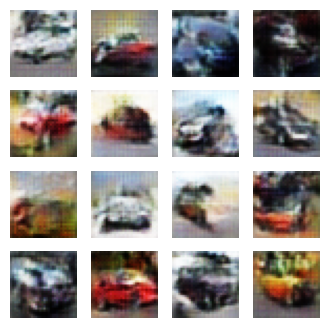

<Figure size 1600x1600 with 0 Axes>

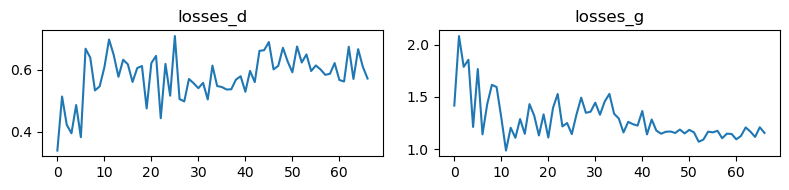

Epoch 67
Time for epoch:  24.92742896080017
Epoch 68
Time for epoch:  25.91573977470398
loss_d=0.59724, loss_g=1.17896
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


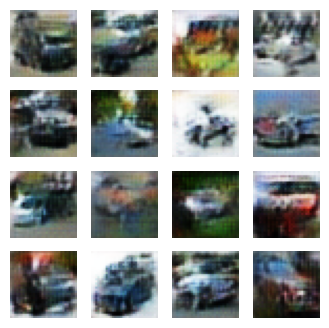

<Figure size 1600x1600 with 0 Axes>

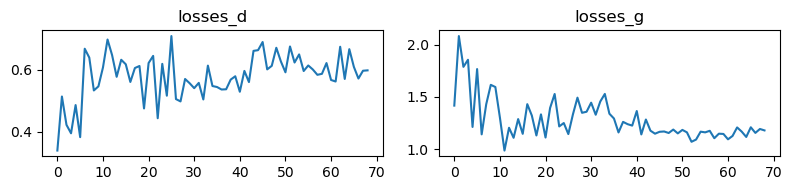

Epoch 69
Time for epoch:  25.826260566711426
Epoch 70
Time for epoch:  26.325676202774048
loss_d=0.60222, loss_g=1.18661
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


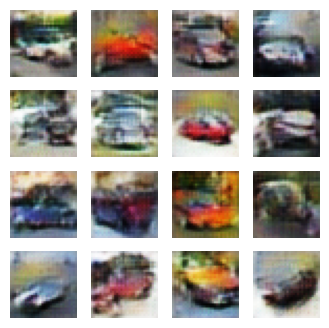

<Figure size 1600x1600 with 0 Axes>

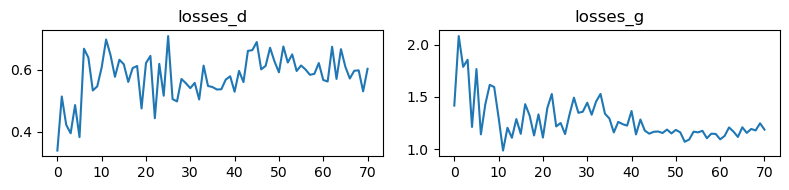

Epoch 71
Time for epoch:  25.467899084091187
Epoch 72
Time for epoch:  25.0927677154541
loss_d=0.55099, loss_g=1.22023
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


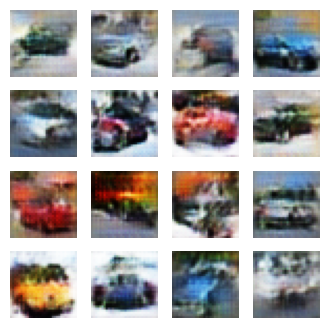

<Figure size 1600x1600 with 0 Axes>

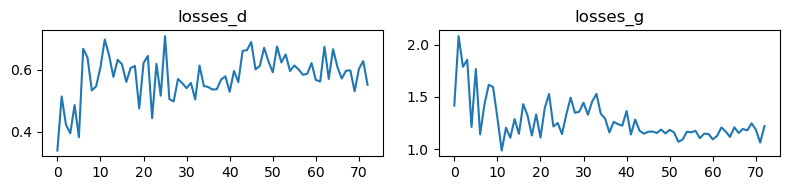

Epoch 73
Time for epoch:  25.40645933151245
Epoch 74
Time for epoch:  24.991131067276
loss_d=0.64663, loss_g=1.08238
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


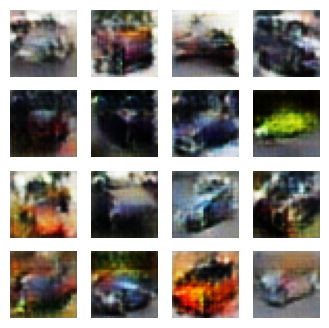

<Figure size 1600x1600 with 0 Axes>

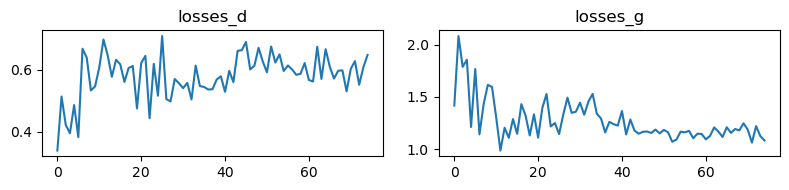

Epoch 75
Time for epoch:  23.108723878860474
Epoch 76
Time for epoch:  22.650026321411133
loss_d=0.59214, loss_g=1.14747
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


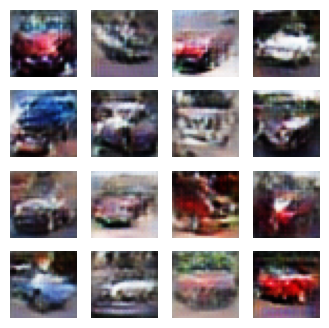

<Figure size 1600x1600 with 0 Axes>

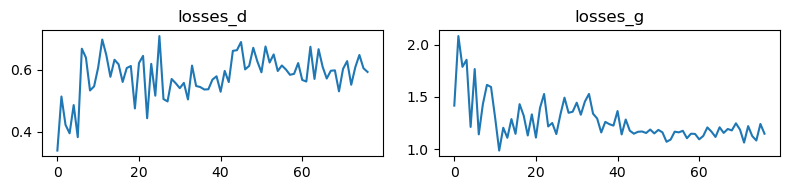

Epoch 77
Time for epoch:  22.733302116394043
Epoch 78
Time for epoch:  22.72810435295105
loss_d=0.58489, loss_g=1.09520
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


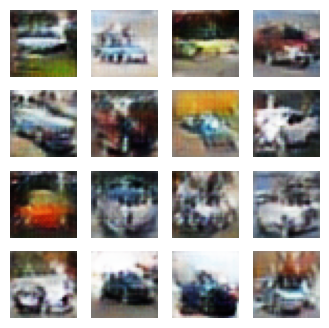

<Figure size 1600x1600 with 0 Axes>

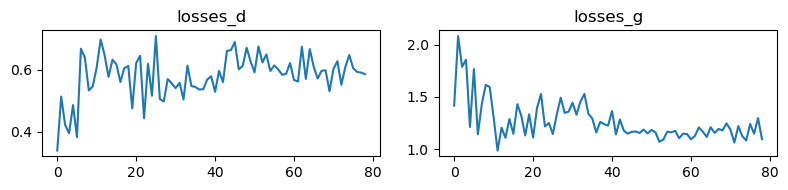

Epoch 79
Time for epoch:  22.51274800300598
Epoch 80
Time for epoch:  22.492544889450073
loss_d=0.54680, loss_g=1.16985
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


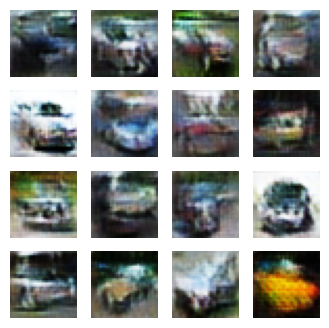

<Figure size 1600x1600 with 0 Axes>

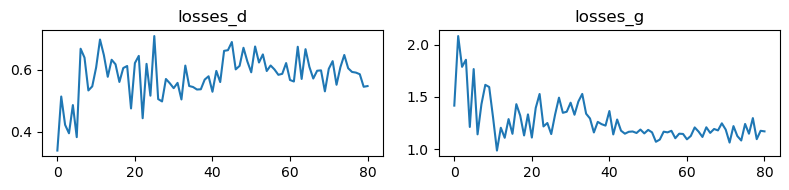

Epoch 81
Time for epoch:  22.658496141433716
Epoch 82
Time for epoch:  22.904135942459106
loss_d=0.54921, loss_g=1.31466
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


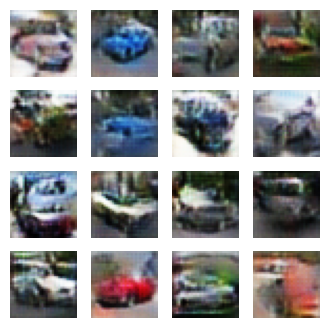

<Figure size 1600x1600 with 0 Axes>

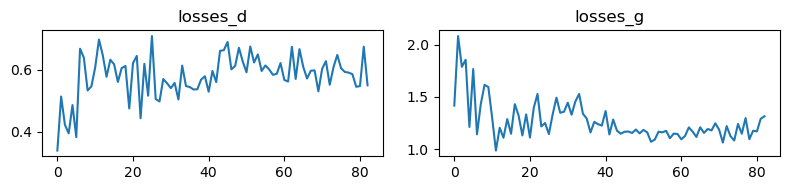

Epoch 83
Time for epoch:  22.607276916503906
Epoch 84
Time for epoch:  22.51223087310791
loss_d=0.57709, loss_g=1.34612
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


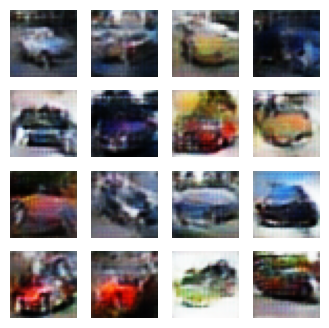

<Figure size 1600x1600 with 0 Axes>

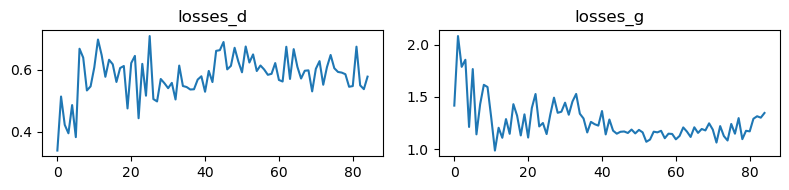

Epoch 85
Time for epoch:  22.72061276435852
Epoch 86
Time for epoch:  22.641185760498047
loss_d=0.55047, loss_g=1.36573
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


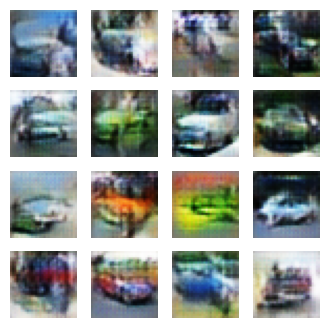

<Figure size 1600x1600 with 0 Axes>

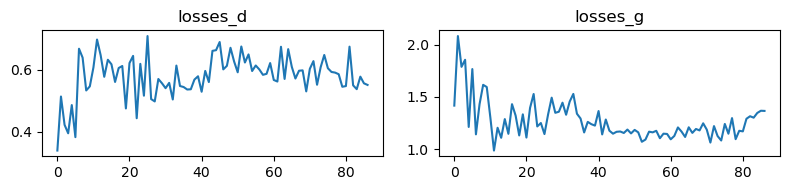

Epoch 87
Time for epoch:  22.668925523757935
Epoch 88
Time for epoch:  22.867457389831543
loss_d=0.52329, loss_g=1.26982
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


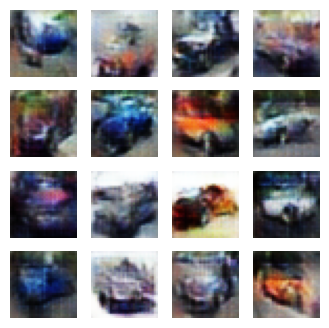

<Figure size 1600x1600 with 0 Axes>

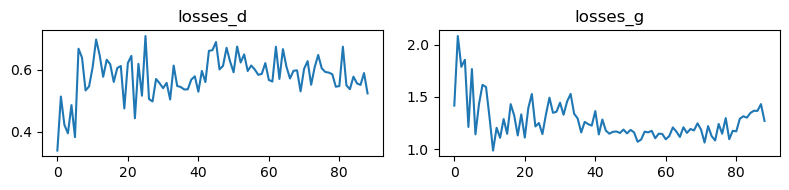

Epoch 89
Time for epoch:  22.660536766052246
Epoch 90
Time for epoch:  22.53076195716858
loss_d=0.51163, loss_g=1.35362
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


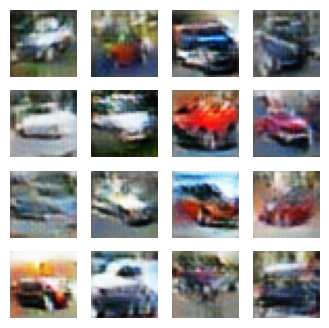

<Figure size 1600x1600 with 0 Axes>

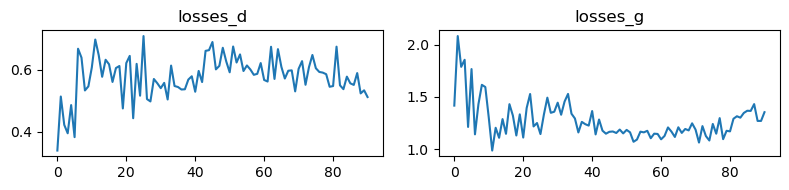

Epoch 91
Time for epoch:  22.537885665893555
Epoch 92
Time for epoch:  22.780927658081055
loss_d=0.51282, loss_g=1.32766
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


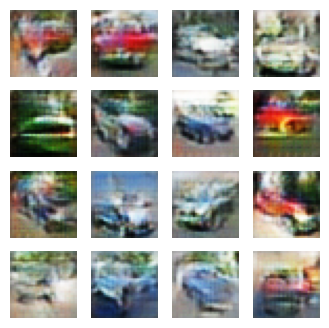

<Figure size 1600x1600 with 0 Axes>

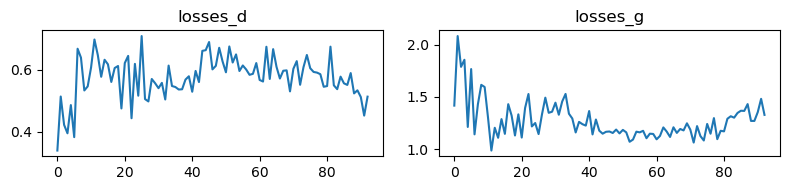

Epoch 93
Time for epoch:  22.936415672302246
Epoch 94
Time for epoch:  22.637655019760132
loss_d=0.58089, loss_g=1.39915
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


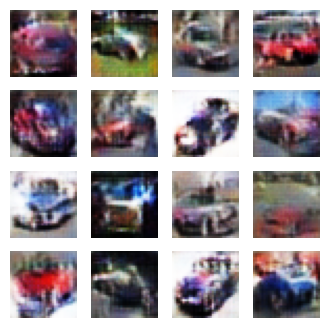

<Figure size 1600x1600 with 0 Axes>

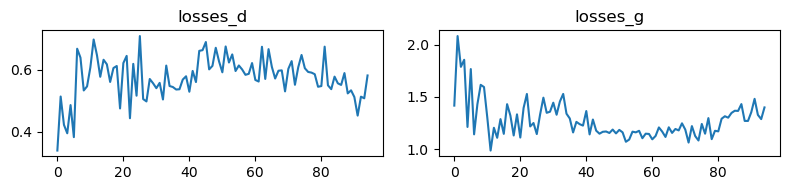

Epoch 95
Time for epoch:  22.522409200668335
Epoch 96
Time for epoch:  22.651363611221313
loss_d=0.52689, loss_g=1.30628
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


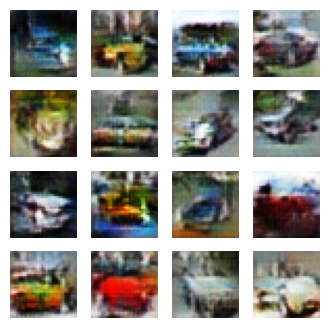

<Figure size 1600x1600 with 0 Axes>

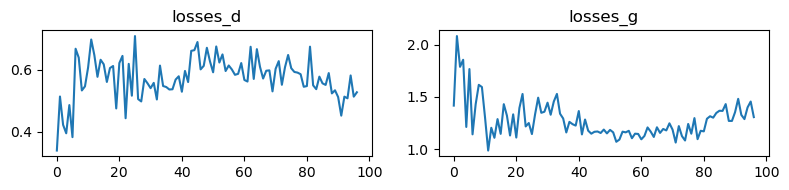

Epoch 97
Time for epoch:  22.493664026260376
Epoch 98
Time for epoch:  22.713332653045654
loss_d=0.49678, loss_g=1.38422
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


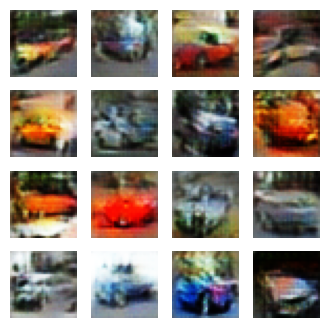

<Figure size 1600x1600 with 0 Axes>

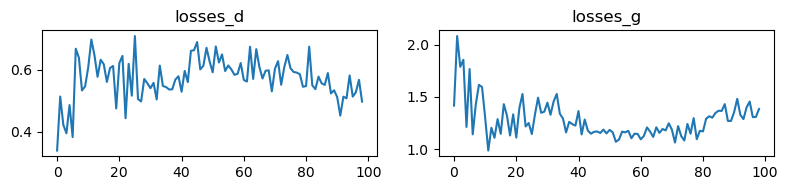

Epoch 99
Time for epoch:  22.637795448303223
Epoch 100
Time for epoch:  22.714861154556274
loss_d=0.54194, loss_g=1.24807
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


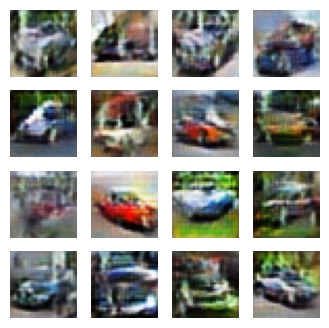

<Figure size 1600x1600 with 0 Axes>

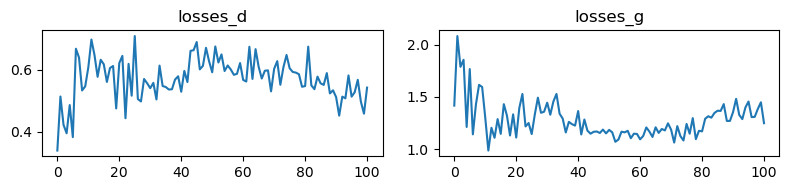

Epoch 101
Time for epoch:  22.647392988204956
Epoch 102
Time for epoch:  22.667912483215332
loss_d=0.52075, loss_g=1.33718
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


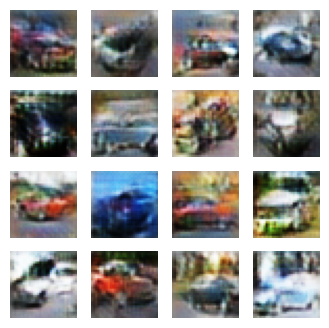

<Figure size 1600x1600 with 0 Axes>

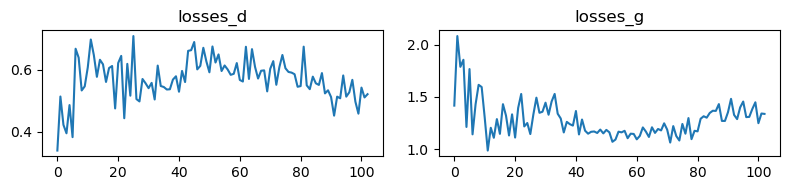

Epoch 103
Time for epoch:  22.86987566947937
Epoch 104
Time for epoch:  22.533987045288086
loss_d=0.51473, loss_g=1.46002
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


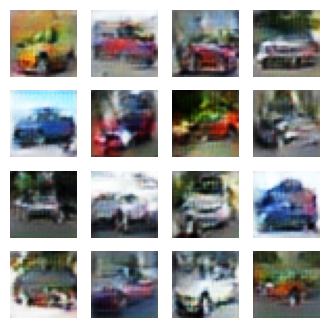

<Figure size 1600x1600 with 0 Axes>

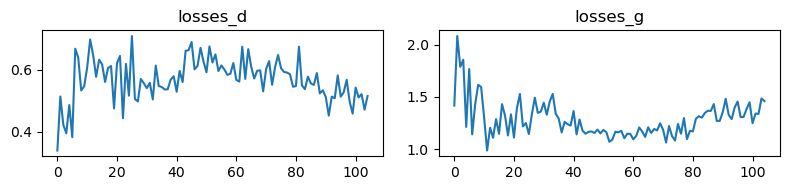

Epoch 105
Time for epoch:  22.631012439727783
Epoch 106
Time for epoch:  22.69995641708374
loss_d=0.50312, loss_g=1.32694
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


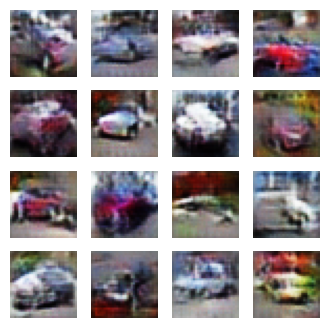

<Figure size 1600x1600 with 0 Axes>

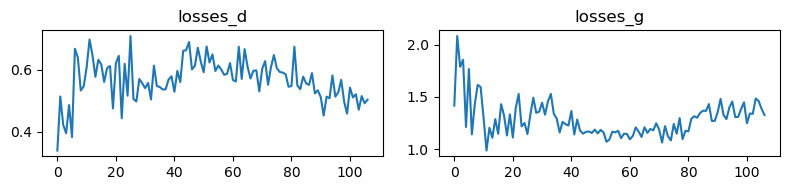

Epoch 107
Time for epoch:  22.907546043395996
Epoch 108
Time for epoch:  22.969983339309692
loss_d=0.52134, loss_g=1.53955
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


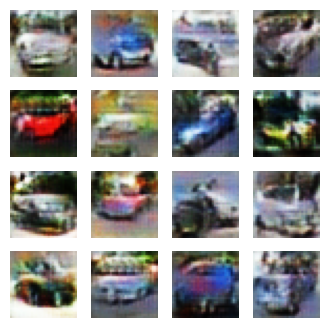

<Figure size 1600x1600 with 0 Axes>

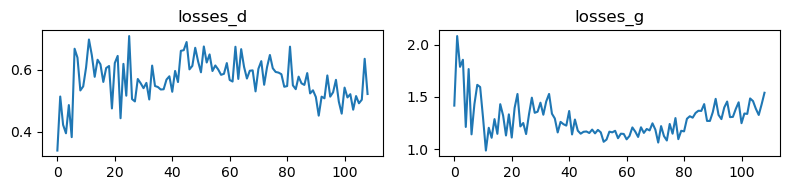

Epoch 109
Time for epoch:  22.652339935302734
Epoch 110
Time for epoch:  22.55508542060852
loss_d=0.47991, loss_g=1.59824
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


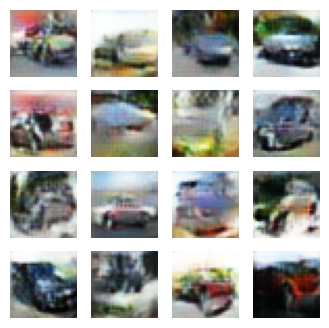

<Figure size 1600x1600 with 0 Axes>

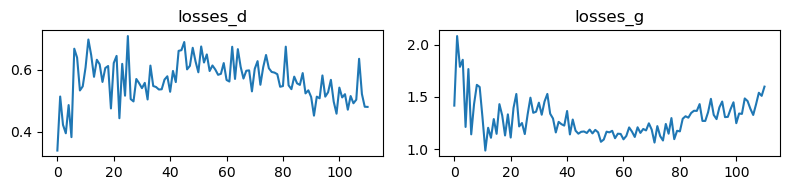

Epoch 111
Time for epoch:  22.684528589248657
Epoch 112
Time for epoch:  22.8486111164093
loss_d=0.52442, loss_g=1.44239
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


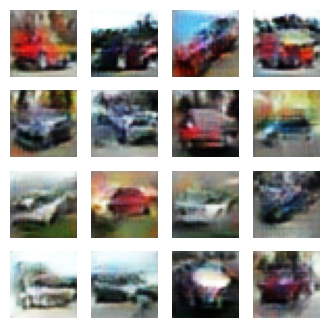

<Figure size 1600x1600 with 0 Axes>

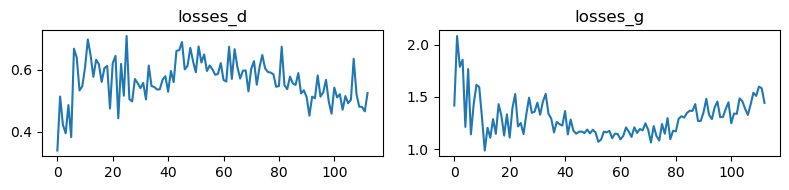

Epoch 113
Time for epoch:  22.730358839035034
Epoch 114
Time for epoch:  23.248741388320923
loss_d=0.47300, loss_g=1.70527
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


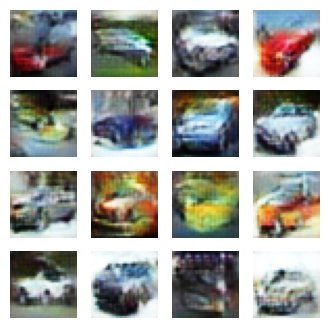

<Figure size 1600x1600 with 0 Axes>

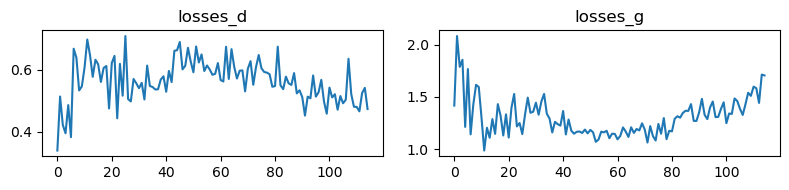

Epoch 115
Time for epoch:  22.451462507247925
Epoch 116
Time for epoch:  22.45165252685547
loss_d=0.43946, loss_g=1.57362
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


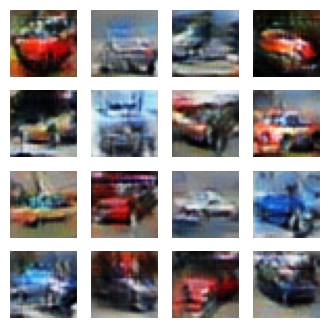

<Figure size 1600x1600 with 0 Axes>

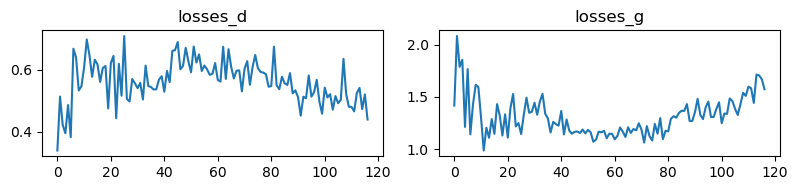

Epoch 117
Time for epoch:  22.688430070877075
Epoch 118
Time for epoch:  22.54106616973877
loss_d=0.44815, loss_g=1.77310
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


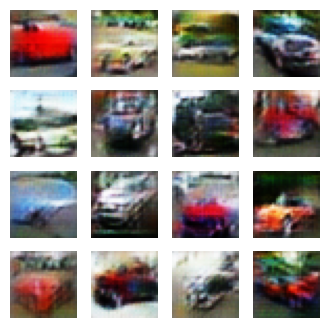

<Figure size 1600x1600 with 0 Axes>

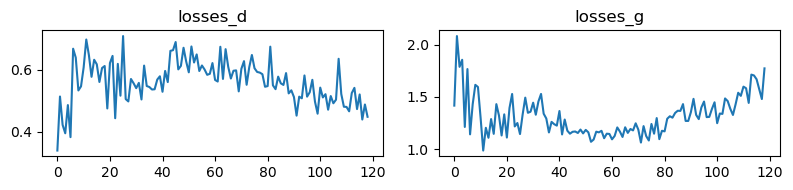

Epoch 119
Time for epoch:  22.508132934570312
Epoch 120
Time for epoch:  22.718363523483276
loss_d=0.42745, loss_g=1.63148
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


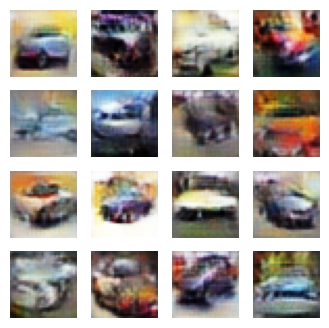

<Figure size 1600x1600 with 0 Axes>

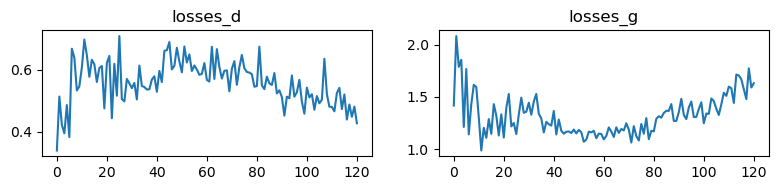

Epoch 121
Time for epoch:  22.48081135749817
Epoch 122
Time for epoch:  22.483755111694336
loss_d=0.50632, loss_g=1.60054
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


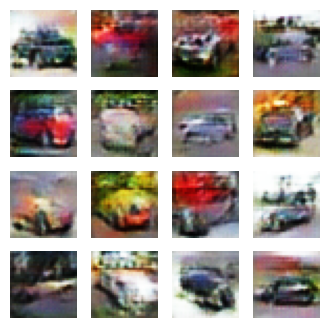

<Figure size 1600x1600 with 0 Axes>

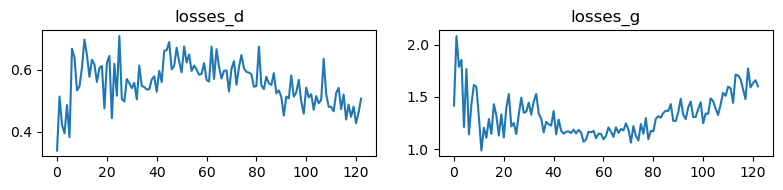

Epoch 123
Time for epoch:  22.523107290267944
Epoch 124
Time for epoch:  22.670111656188965
loss_d=0.52465, loss_g=1.51757
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


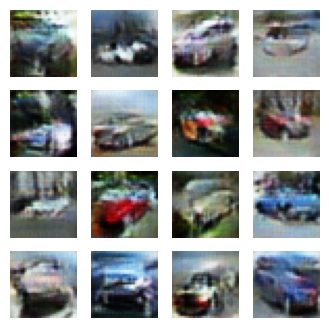

<Figure size 1600x1600 with 0 Axes>

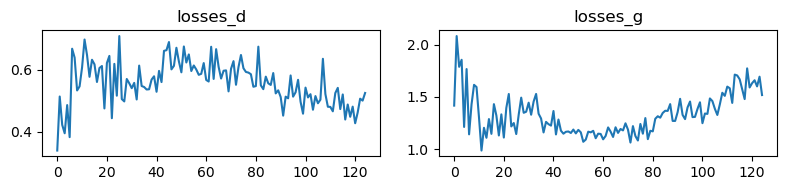

Epoch 125
Time for epoch:  22.745317935943604
Epoch 126
Time for epoch:  22.50226378440857
loss_d=0.45548, loss_g=1.69305
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


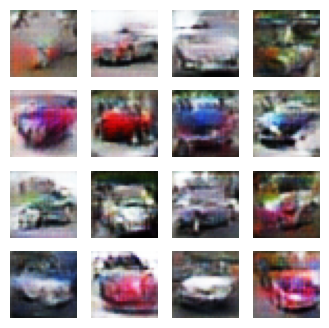

<Figure size 1600x1600 with 0 Axes>

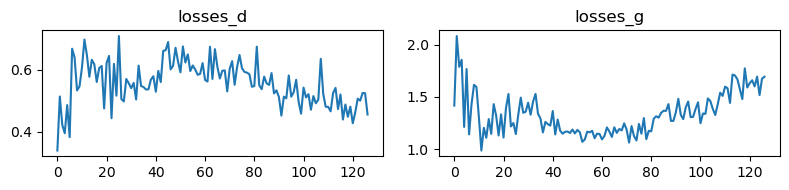

Epoch 127
Time for epoch:  22.48870587348938
Epoch 128
Time for epoch:  22.593807697296143
loss_d=0.46581, loss_g=1.72019
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


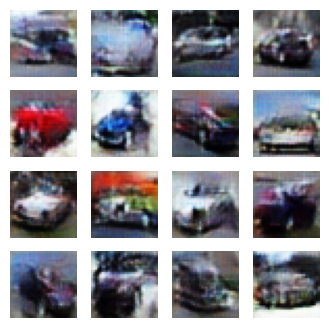

<Figure size 1600x1600 with 0 Axes>

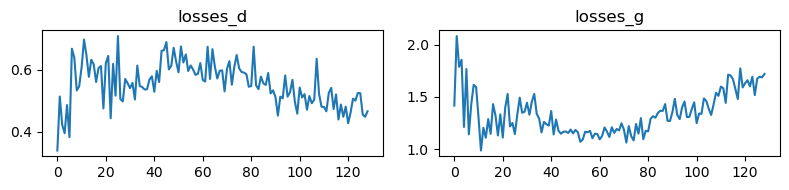

Epoch 129
Time for epoch:  22.604748964309692
Epoch 130
Time for epoch:  22.617480039596558
loss_d=0.54977, loss_g=1.78623
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


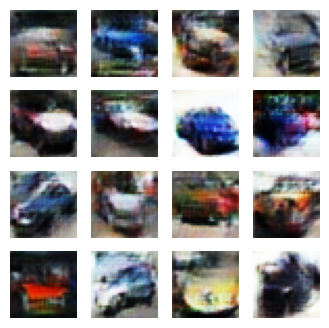

<Figure size 1600x1600 with 0 Axes>

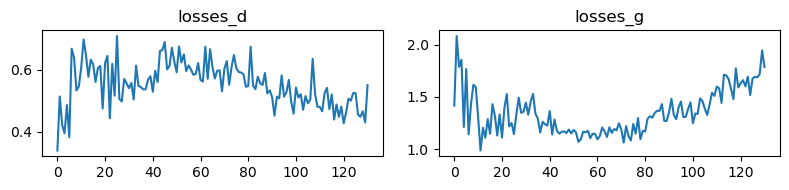

Epoch 131
Time for epoch:  22.579272508621216
Epoch 132
Time for epoch:  22.531294345855713
loss_d=0.44672, loss_g=1.81814
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


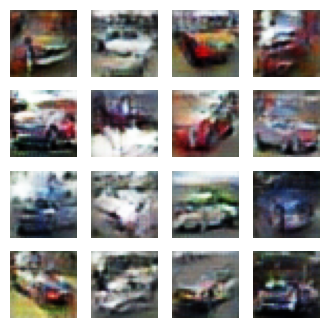

<Figure size 1600x1600 with 0 Axes>

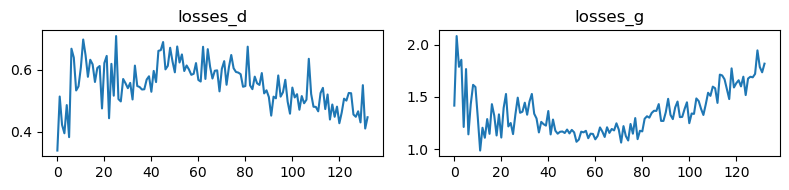

Epoch 133
Time for epoch:  22.48856210708618
Epoch 134
Time for epoch:  22.484772443771362
loss_d=0.47444, loss_g=1.93429
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


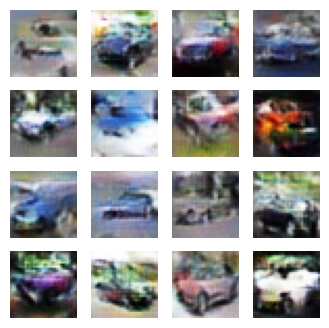

<Figure size 1600x1600 with 0 Axes>

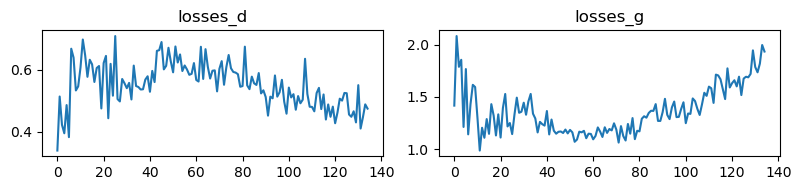

Epoch 135
Time for epoch:  22.715723037719727
Epoch 136
Time for epoch:  22.60366201400757
loss_d=0.37846, loss_g=2.15162
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


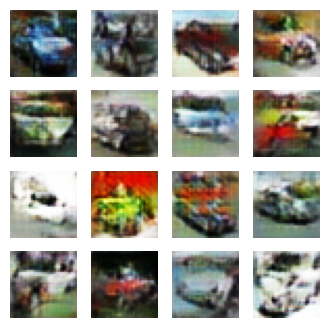

<Figure size 1600x1600 with 0 Axes>

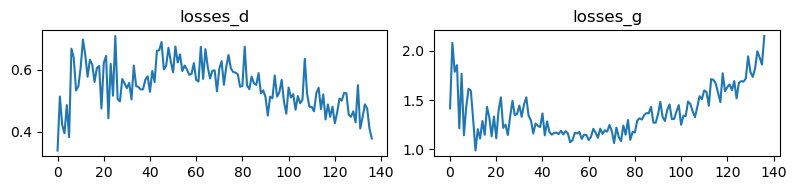

Epoch 137
Time for epoch:  23.104554891586304
Epoch 138
Time for epoch:  22.900174379348755
loss_d=0.46498, loss_g=1.77078
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


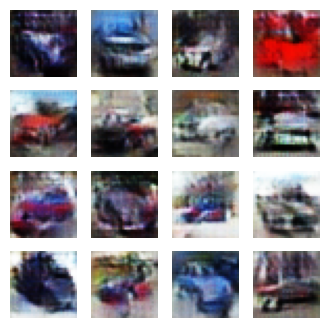

<Figure size 1600x1600 with 0 Axes>

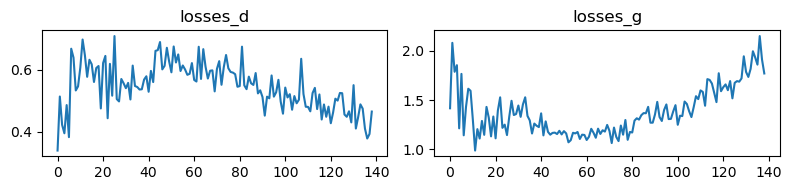

Epoch 139
Time for epoch:  22.504472732543945
Epoch 140
Time for epoch:  22.431938648223877
loss_d=0.40903, loss_g=1.78653
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


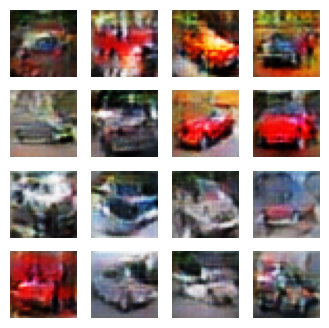

<Figure size 1600x1600 with 0 Axes>

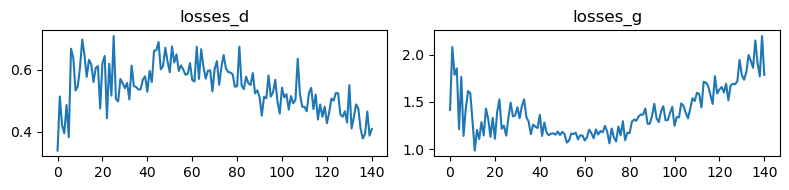

Epoch 141
Time for epoch:  22.809387683868408
Epoch 142
Time for epoch:  22.708038806915283
loss_d=0.49950, loss_g=1.94345
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


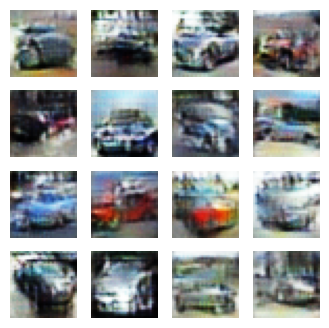

<Figure size 1600x1600 with 0 Axes>

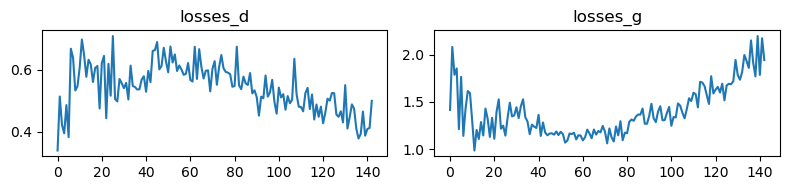

Epoch 143
Time for epoch:  22.969200372695923
Epoch 144
Time for epoch:  22.502071142196655
loss_d=0.41715, loss_g=1.93893
2/2 [==============================] - 0s 5ms/step
	Plotting images and losses


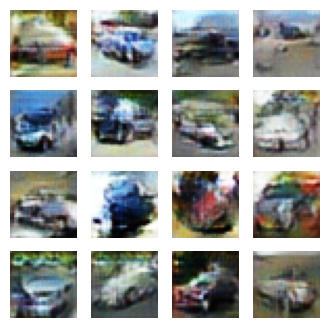

<Figure size 1600x1600 with 0 Axes>

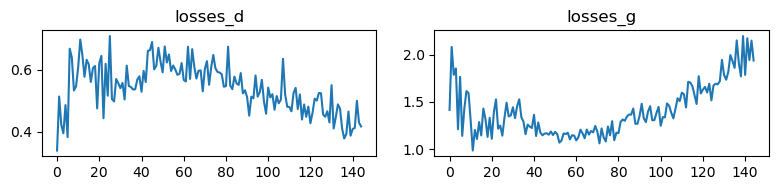

Epoch 145
Time for epoch:  22.493084192276
Epoch 146
Time for epoch:  22.692816257476807
loss_d=0.37683, loss_g=1.96032
2/2 [==============================] - 0s 4ms/step
	Plotting images and losses


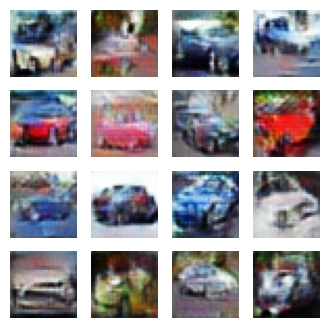

<Figure size 1600x1600 with 0 Axes>

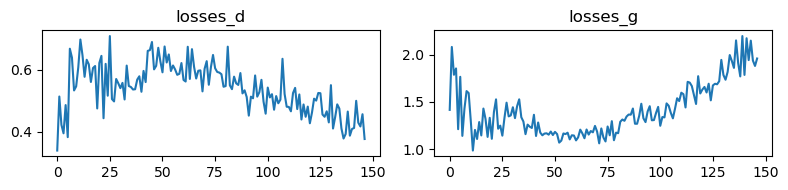

Epoch 147
Time for epoch:  22.796953916549683
Epoch 148
Time for epoch:  22.987403869628906
loss_d=0.48903, loss_g=2.11971
2/2 [==============================] - 0s 3ms/step
	Plotting images and losses


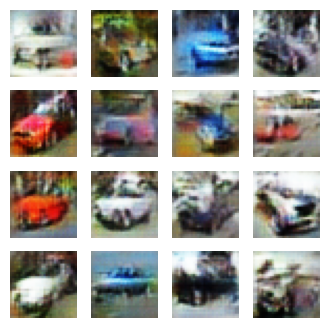

<Figure size 1600x1600 with 0 Axes>

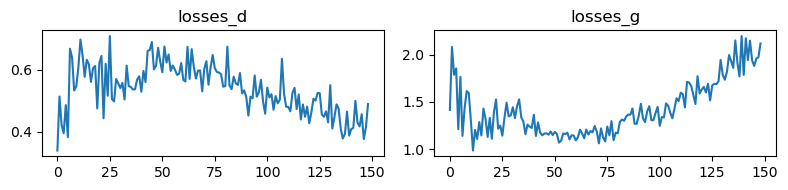

Epoch 149
Time for epoch:  22.544644594192505


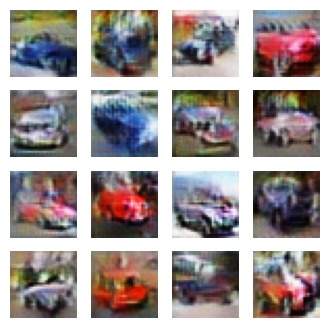

In [5]:
#Training Function
def train(z_dim=100, epochs=150,
          batch_size=16, epoch_per_checkpoint=2, n_checkpoint_images=36):

    #Load the CIFAR10 data
    (X_train, y_train), (X_test, y_test) = cifar10.load_data()
    #Concatenate X_train and X_test for more data
    X_train = np.concatenate((X_train,X_test))
    y_train = np.concatenate((y_train,y_test))
    #Only grab cars
    index = np.where(y_train.reshape(-1) == 1)
    X_train = X_train[index]
    y_train = y_train[index]
    #Convert data to floats, Scale data to -1, 1
    X_train = X_train.astype(np.float32)
    X_test = X_test.astype(np.float32)
    X_train = X_train/127.5 - 1.0
    
    
    #Get image shapes and values for reference
    image_shape = X_train[0].shape
    print("image shape {}, min val {}, max val {}".format(image_shape, X_train[0].min(), X_train[0].max()))
    #Plot real images for reference
    plot_images(X_train[:n_checkpoint_images], "real_images.png")


    #Get labels for computing the losses
    labels_real = np.ones(shape=(batch_size, 1)) 
    labels_fake = np.zeros(shape=(batch_size, 1))
    #Smooth labels to prevent mode collapse
    labels_real = smooth_positive_labels(labels_real)
    labels_fake = smooth_negative_labels(labels_fake)

    losses_d, losses_g = [], []

    
    # training loop
    for e in range(epochs):
        start = time.time()
        print("Epoch {}".format(e))
        for i in range(len(X_train) // batch_size):

            # update Discriminator weights
            D.trainable = True

            # Get real samples, train discriminator on them
            real_images = X_train[i*batch_size: (i+1)*batch_size]
            #Feed noisy images to discriminator
#             for j in range(batch_size):
#                 real_images[j] = noisy(real_images[j])
            loss_d_real = D.train_on_batch(x=real_images, y=labels_real)[0]

            # Make fake samples, train discriminator on them
            z = generate_latent_points(z_dim, batch_size)
            fake_images = G.predict_on_batch(z)
            #Feed noisy images to discriminator
#             for j in range(batch_size):
#                 fake_images[j] = noisy(fake_images[j])
            loss_d_fake = D.train_on_batch(x=fake_images, y=labels_fake)[0]

            # Compute Discriminator's loss
            loss_d = 0.5 * (loss_d_real + loss_d_fake)

#             # Train the generator while the discriminator is static
#             D.trainable = False
#             loss_g1 = D_of_G.train_on_batch(x=z, y=labels_real)[0]
#             # Update Generator again (train it twice as much as the Discriminator)
#             loss_g2 = D_of_G.train_on_batch(x=z, y=labels_real)[0]
            
#             # Compute Generator's loss
#             loss_g = 0.5 * (loss_g1 + loss_g2)
            # Train the generator while the discriminator is static
            D.trainable = False
            loss_g = D_of_G.train_on_batch(x=z, y=labels_real)[0]

            
        #Keep track of losses for plotting
        losses_d.append(loss_d)
        losses_g.append(loss_g)
        
        end = time.time()
        print("Time for epoch:  " + str(end-start))

        
        #Plot losses and generated images every X epochs
        if (e % epoch_per_checkpoint) == 0:
            print("loss_d={:.5f}, loss_g={:.5f}".format(loss_d, loss_g))
            
            # fix a z vector for training evaluation
            z_fixed = generate_latent_points(z_dim, n_checkpoint_images)
            
            fake_images = G.predict(z_fixed)
            print("\tPlotting images and losses")
            plot_images(fake_images, "fake_images_cars_e{}.png".format(e))
            plot_losses(losses_d, losses_g, "losses.png")
            
            #Show Images
            fake_images = (fake_images + 1) * 127.5
            fake_images = np.rint(fake_images)
            fake_images = fake_images.astype(int)

            fig,axs = plt.subplots(4,4,figsize=(4,4),sharey=True,sharex=True)
            cnt=0
            for k in range(4):
                for l in range(4):
                    axs[k, l].imshow(fake_images[cnt,:,:])
                    axs[k, l].axis('off')
                    cnt+=1

            #Save Model every 10 epochs
#             if (e % 10) == 0 and e != 0:
#                 print('Saving Models')
#                 D.save('./DiscriminatorModel')
#                 D_of_G.save('./CombinedModel')
            
            
train()

4/4 [==============================] - 0s 9ms/step


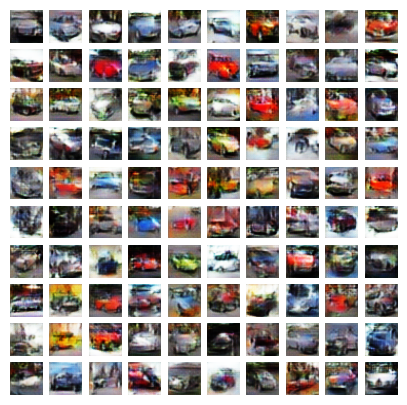

In [6]:
# #Print example images 
n_checkpoint_images = 100
z_dim = 100
#z_fixed = np.random.uniform(-1, 1, size=(n_checkpoint_images, z_dim))
z_fixed = generate_latent_points(z_dim, n_checkpoint_images)
fake_images = G.predict(z_fixed) #Predicted 'images' are (32,32,3) arrays with values -1 to 1
#Convert fake images into actual values for plotting (ints between 0 and 255)
fake_images = (fake_images + 1) * 127.5
fake_images = np.rint(fake_images)
fake_images = fake_images.astype(int)

fig,axs = plt.subplots(10,10,figsize=(5,5),sharey=True,sharex=True)
cnt=0
for k in range(10):
    for l in range(10):
        axs[k, l].imshow(fake_images[cnt,:,:])
        axs[k, l].axis('off')
        cnt+=1

4/4 [==============================] - 0s 9ms/step


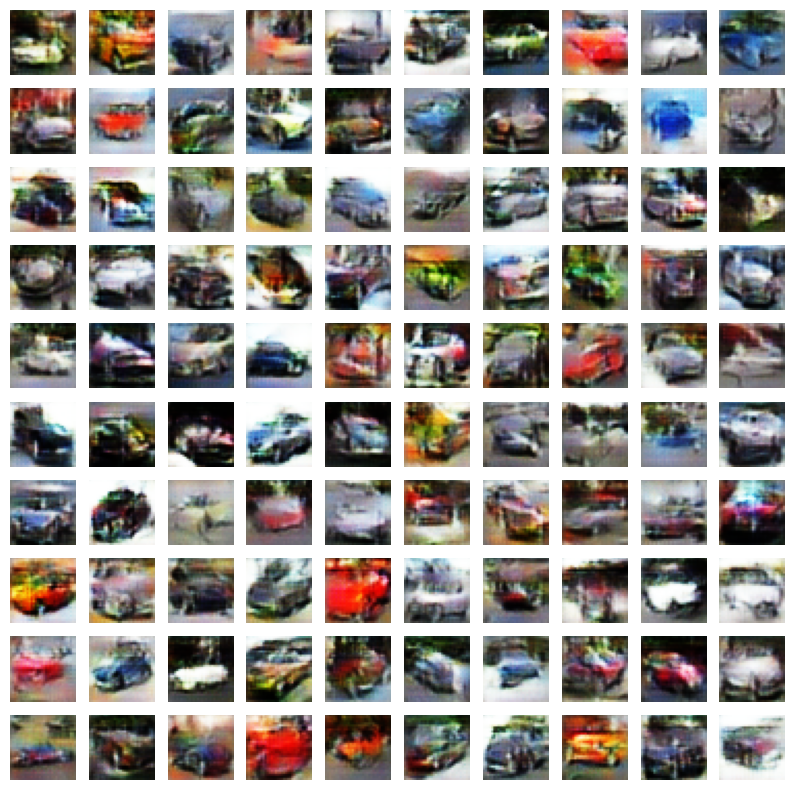

In [12]:
# #Print example images 
#Default Sets, 250 epochs
n_checkpoint_images = 100
z_dim = 100
#z_fixed = np.random.uniform(-1, 1, size=(n_checkpoint_images, z_dim))
z_fixed = generate_latent_points(z_dim, n_checkpoint_images)
fake_images = G.predict(z_fixed) #Predicted 'images' are (32,32,3) arrays with values -1 to 1
#Convert fake images into actual values for plotting (ints between 0 and 255)
fake_images = (fake_images + 1) * 127.5
fake_images = np.rint(fake_images)
fake_images = fake_images.astype(int)

fig,axs = plt.subplots(10,10,figsize=(10,10),sharey=True,sharex=True)
cnt=0
for k in range(10):
    for l in range(10):
        axs[k, l].imshow(fake_images[cnt,:,:])
        axs[k, l].axis('off')
        cnt+=1